# LIBRARIES

In [1]:
import os
import math
import numpy as np
import pandas as pd
from glob import glob
from PIL import Image
from tqdm import tqdm
from sklearn.model_selection import StratifiedShuffleSplit, StratifiedKFold
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as patches
from pathlib import Path

# CONFIGURATIONS

In [2]:
SEED = 42

DATASETS_CONFIG = {
    "TILDA": {
        "root": "/kaggle/input/datasets/angelolmg/tilda-400",
        "classes": {0: "Hole", 1: "Objects", 2: "OilSpot", 3: "ThreadError"},
        "colors": ["#2ecc71", "#e74c3c", "#3498db", "#f1c40f", "#9b59b6"], # Good + 4 classes
        "patterns": None 
    },
    "HKU": {
        "root": "/kaggle/input/hku-dataset",
        "classes": {0: "BrokenEnd", 1: "Hole", 2: "NettingMultiple", 3: "ThickBar", 4: "ThinBar", 5: "Knots"},
        "colors": ["#009B00", "#FF0000", "#0000FF", "#FFA500", "#800080", "#00FFFF", "#FFFF00"], # Good + 6 classes
        "patterns": [
            "box-patterned-fabric_with_groundtruth",
            "dot-patterned_fabric_with_groundtruth",
            "star-patterned fabric_with_groundtruth"
        ]
    }
}

# UTILITIES

In [3]:
def build_dataset_census(dataset_type):
    """Varre as pastas e constrói um DataFrame padronizado com caminhos e classes."""
    cfg = DATASETS_CONFIG[dataset_type]
    census_data = []
    
    print(f"🔍 Iniciando censo para: {dataset_type}")

    if dataset_type == "TILDA":
        # Lógica TILDA: Glob direto na raiz
        img_paths = sorted(glob(os.path.join(cfg['root'], "images", "*.tif")))
        for p in img_paths:
            base = os.path.splitext(os.path.basename(p))[0]
            lbl_path = os.path.join(cfg['root'], "labels", base + ".txt")
            msk_path = os.path.join(cfg['root'], "masks", base + ".png")
            
            # Se não tiver label, assumimos 'good'
            if not os.path.exists(lbl_path):
                c_name, c_idx = "good", 0
            else:
                with open(lbl_path, "r") as f:
                    first_line = f.readline().split()
                    c_idx = int(first_line[0]) + 1 if first_line else 0
                    c_name = cfg['classes'].get(c_idx-1, "good")
            
            census_data.append({
                "img_id": base, 
                "img_path": p, 
                "msk_path": msk_path, 
                "class_name": c_name, 
                "class_idx": c_idx,
                "fabric_type": "plain" # TILDA é padrão único
            })

    elif dataset_type == "HKU":
        # Lógica HKU: Varredura de Subpastas (Patterns -> Classes)
        for pattern in cfg['patterns']:
            pattern_path = os.path.join(cfg['root'], pattern)
            if not os.path.exists(pattern_path): continue
            
             # Extrai o tipo de tecido (ex: "box", "dot", "star") do nome da pasta raiz
            # Ex: "box-patterned-fabric_with_groundtruth" -> "box"
            fabric_label = pattern.split('-')[0]
            
            for class_folder in os.listdir(pattern_path):
                class_path = os.path.join(pattern_path, class_folder)
                if not os.path.isdir(class_path): continue

                is_good = class_folder == "Reference"
                all_bmps = glob(os.path.join(class_path, "*.bmp"))
                # Filtra para pegar apenas as imagens originais, ignorando as máscaras groundT_
                image_paths = [p for p in all_bmps if not os.path.basename(p).startswith("groundT_")]

                for img_p in image_paths:
                    base = os.path.basename(img_p)
                    # No HKU, a máscara está na mesma pasta com prefixo "groundT_"
                    # Se for a pasta 'Reference', não há máscara de defeito (consideramos None)
                    msk_p = os.path.join(class_path, f"groundT_{base}") if not is_good else None
                    
                    # Mapear classe para índice
                    if is_good:
                        c_name, c_idx = "good", 0
                    else:
                        c_name = class_folder
                        # Inverter o dicionário para achar o índice pelo nome
                        c_idx = [k for k, v in cfg['classes'].items() if v == c_name][0] + 1

                    census_data.append({
                        "img_id": f"{os.path.splitext(base)[0]}",
                        "img_path": img_p,
                        "msk_path": msk_p,
                        "class_name": c_name,
                        "class_idx": c_idx,
                        "fabric_type": fabric_label
                    })

    df = pd.DataFrame(census_data)
    print(f"✅ Censo concluído: {len(df)} imagens encontradas.")
    return df

def perform_stratified_split(df_census, seed=42, n_folds=5, test_size=0.20):
    """Divide as imagens originais em Teste e Folds de Treino/Validação."""
    from sklearn.model_selection import StratifiedShuffleSplit, StratifiedKFold
    
    sss = StratifiedShuffleSplit(n_splits=1, test_size=test_size, random_state=seed)
    train_val_idx, test_idx = next(sss.split(df_census, df_census['class_idx']))

    df_test = df_census.iloc[test_idx].copy()
    df_train_val = df_census.iloc[train_val_idx].copy().reset_index(drop=True)

    skf = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=seed)
    folds_dict = {} 
    for fold, (t_idx, v_idx) in enumerate(skf.split(df_train_val, df_train_val['class_idx'])):
        folds_dict[f"Fold_{fold}"] = {
            "train": df_train_val.iloc[t_idx].copy(),
            "val": df_train_val.iloc[v_idx].copy()
        }
    return df_test, folds_dict

def process_to_npz(df_split, output_dir, filename, patch_size, tolerance=None, clamp=None):
    """Corta patches e gera o arquivo NPZ final, acumulando interseção e união de pixels."""
    X_patches, y_multi, y_binary, groups, coords, fabrics = [], [], [], [], [], []
    os.makedirs(output_dir, exist_ok=True)

    use_threshold_logic = (tolerance is not None) and (clamp is not None)
    
    # Variáveis para acumular os pixels reais deste split específico
    split_pixel_intersection = 0
    split_pixel_union = 0
    
    for _, row in tqdm(df_split.iterrows(), total=len(df_split), desc=f"Saving {filename}"):
        img = np.array(Image.open(row['img_path']))
        
        if row['msk_path'] and os.path.exists(row['msk_path']):
            mask = np.array(Image.open(row['msk_path']))
        else:
            mask = np.zeros(img.shape[:2], dtype=np.uint8)
        
        if mask.ndim == 3: 
            mask = mask[:, :, 0]
            
        total_defect_px = np.count_nonzero(mask)

        if use_threshold_logic and total_defect_px > 0:
            req_dynamic = max(1, int(total_defect_px * tolerance))
            final_thresh = min(req_dynamic, int((patch_size**2) * clamp))
        else:
            final_thresh = 0

        h, w = img.shape[:2]
        for i in range(h // patch_size):
            for j in range(w // patch_size):
                y, x = i * patch_size, j * patch_size
                p_mask = mask[y:y+patch_size, x:x+patch_size]
                
                # Decisão do rótulo do patch
                if use_threshold_logic:
                    is_def = (np.count_nonzero(p_mask) >= final_thresh) and (total_defect_px > 0)
                else:
                    is_def = np.count_nonzero(p_mask) > 0
                
                # 🛠️ CÁLCULO GEOMÉTRICO CORRETO EM PIXELS
                # Interseção: pixels ativos na máscara real dentro do patch que foi ativado
                p_inter = np.count_nonzero(p_mask > 0) if is_def else 0
                
                # União: se o patch acendeu, ele assume 'patch_size**2' pixels. 
                # Se não acendeu, a união é o que sobrou de pixels na máscara (falso negativo)
                p_union = (patch_size ** 2) if is_def else np.count_nonzero(p_mask > 0)
                
                split_pixel_intersection += p_inter
                split_pixel_union += p_union

                X_patches.append(img[y:y+patch_size, x:x+patch_size])
                y_multi.append(row['class_idx'] if is_def else 0)
                y_binary.append(1 if is_def else 0)
                groups.append(row['img_id'])
                coords.append([i, j])
                fabrics.append(row['fabric_type'])

    # Salva o arquivo comprimido incluindo os escalares de área acumulada do split
    np.savez_compressed(
        os.path.join(output_dir, filename),
        X=np.stack(X_patches),
        y_multi=np.array(y_multi, dtype=np.int8),
        y_binary=np.array(y_binary, dtype=np.int8),
        groups=np.array(groups),
        coords=np.array(coords, dtype=np.int16),
        fabrics=np.array(fabrics),
        # 🛠️ Guardamos os totais absolutos de pixels para o cálculo de IoU global legítimo
        pixel_intersection=np.array(split_pixel_intersection, dtype=np.int64),
        pixel_union=np.array(split_pixel_union, dtype=np.int64)
    )

def plot_sample_patches_from_npz(output_dir, filename, class_map, colors, n_samples=3):
    """Mostra exemplos de patches extraídos para validação visual."""
    filepath = os.path.join(output_dir, filename)
    if not os.path.exists(filepath): return
    
    with np.load(filepath) as data:
        X, y = data['X'], data['y_multi']
        
    num_classes = len(class_map)
    fig, axes = plt.subplots(n_samples, num_classes, figsize=(num_classes * 3, n_samples * 3))
    
    for c_idx, c_name in class_map.items():
        idx_list = np.where(y == c_idx)[0]
        if len(idx_list) == 0: continue
        
        chosen = np.random.choice(idx_list, min(n_samples, len(idx_list)), replace=False)
        for row_idx, patch_idx in enumerate(chosen):
            ax = axes[row_idx, c_idx] if n_samples > 1 else axes[c_idx]
            img = X[patch_idx]
            ax.imshow(img.squeeze(), cmap='gray' if img.ndim==2 else None)
            ax.axis('off')
            if row_idx == 0:
                ax.set_title(c_name.upper(), fontsize=12, fontweight='bold', color=colors[c_idx%len(colors)])
    plt.tight_layout()
    plt.show()

def run_full_eda_report(dataset_name, output_dir, class_map, n_folds=5):
    """
    Gera o relatório estatístico completo, plota a distribuição de patches
    em escala logarítmica, monta a tabela cruzada por tipo de tecido e retorna
    o sumário formatado para a tabela comparativa de tamanhos de patch.
    """
    cfg = DATASETS_CONFIG[dataset_name]
    records = []
    
    # Acumuladores globais de pixels para o cálculo correto do IoU Geométrico
    global_intersection_px = 0
    global_union_px = 0
    
    def get_stats(fname):
        nonlocal global_intersection_px, global_union_px
        path = os.path.join(output_dir, fname)
        if not os.path.exists(path): 
            return None
            
        with np.load(path) as d:
            y, g = d['y_multi'][:], d['groups'][:]
            
            # Recupera a interseção e união absolutas salvas pelo process_to_npz
            if 'pixel_intersection' in d and 'pixel_union' in d:
                global_intersection_px += int(d['pixel_intersection'])
                global_union_px += int(d['pixel_union'])
                
            return len(np.unique(g)), len(y), {class_map[i]: np.sum(y == i) for i in class_map.keys()}

    print(f"\n{'='*80}")
    print(f"📊 GERANDO RELATÓRIO COMPLETO EDA: {dataset_name.upper()}")

    # 1. COLETA DE DADOS DE TODOS OS SPLITS
    splits_to_check = [("Test Set", "test_set.npz")] + [
        (f"F{f+1} - {s}", f"Fold_{f}_{s.lower()}.npz") for f in range(n_folds) for s in ["Train", "Val"]
    ]
    
    for label, fname_base in splits_to_check:
        res = get_stats(fname_base)
        if res:
            row = {"Split": label, "Images": res[0], "Total Patches": res[1]}
            row.update(res[2])
            records.append(row)

    if not records:
        print(f"❌ Nenhum arquivo .npz encontrado em: {output_dir}")
        return None

    df_report = pd.DataFrame(records)
    print("\n📈 Tabela de Distribuição por Divisão (Splits):")
    display(df_report)

    # 2. CÁLCULO E EXIBIÇÃO DO MEAN PIXEL IOU REAL
    real_global_iou = 0.0
    if global_union_px > 0:
        real_global_iou = global_intersection_px / global_union_px
        print("\n📐 MÉTRICA GEOMÉTRICA DA MÁSCARA (GROUND TRUTH VS PATCHES):")
        print(f"  • Total Pixels Interseção: {global_intersection_px}")
        print(f"  • Total Pixels União:       {global_union_px}")
        print(f"  • Mean Pixel IoU Real:      {real_global_iou:.5f}")
    else:
        print("\n⚠️ Alerta: Dados de pixel zerados ou ausentes nos arquivos .npz.")

    # 3. TABELA CRUZADA: DISTRIBUIÇÃO DE PATCHES POR TIPO DE TECIDO
    test_path = os.path.join(output_dir, "test_set.npz")
    if os.path.exists(test_path):
        with np.load(test_path) as data:
            y_test, fabrics_test = data['y_multi'], data['fabrics']

        # Reconstrói o mapeamento completo incluindo a classe 'good' (0)
        full_class_map = {0: "good"}
        full_class_map.update({k + 1: v for k, v in cfg['classes'].items()})
        
        df_analise = pd.DataFrame({'Class': y_test, 'Fabric': fabrics_test})
        ctab = pd.crosstab(df_analise['Fabric'], df_analise['Class'])
        ctab = ctab.rename(columns=full_class_map)
        
        print(f"\n🧶 Distribuição de Patches por Tecido no Test Set ({dataset_name}):")
        display(ctab)

    # 4. VISUALIZAÇÃO GRÁFICA (LOG SCALE)
    classes = list(class_map.values())
    x = np.arange(len(classes))
    width = 0.12
    offsets = [-2.5*width, -1.5*width, -0.5*width, 0.5*width, 1.5*width, 2.5*width]
    
    plt.figure(figsize=(16, 7))
    C_TRAIN, C_VAL, C_TEST = "#3498db", "#f39c12", "#e74c3c"
    
    for f in range(n_folds):
        train_c = [records[1 + f*2][c] for c in classes] 
        val_c = [records[2 + f*2][c] for c in classes]   
        
        plt.bar(x + offsets[f], train_c, width, color=C_TRAIN, edgecolor='white', 
                label='Train' if f==0 else "")
        plt.bar(x + offsets[f], val_c, width, bottom=train_c, color=C_VAL, edgecolor='white', 
                label='Validation' if f==0 else "")
        
        for i in range(len(classes)):
            total_h = train_c[i] + val_c[i]
            if total_h > 0:
                plt.text(x[i] + offsets[f], total_h * 1.1, f"F{f+1}", ha='center', fontsize=11, rotation=45)

    test_c = [records[0][c] for c in classes]
    plt.bar(x + offsets[5], test_c, width, color=C_TEST, edgecolor='white', hatch='//', 
            label='Test Set')

    plt.yscale('log')
    plt.title(f"Patch Distribution per Class - {dataset_name} (Log Scale)", fontsize=14, fontweight='bold')
    plt.xlabel("Classes", fontsize=16)
    plt.ylabel("Number of Patches (Log)", fontsize=16)
    plt.xticks(x, [c for c in classes], fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(axis='y', linestyle='--', alpha=0.3, which='both')
    plt.legend(loc='upper right', fontsize=15)
    plt.tight_layout()
    plt.show()

    # 5. PREPARAÇÃO DO SUMÁRIO PARA A TABELA COMPARATIVA
    classes_colunas = list(class_map.values())
    somas_classes = df_report[classes_colunas].sum().to_dict()
    
    total_patches = sum(somas_classes.values())
    total_good = somas_classes.get('good', 0)
    total_defective = total_patches - total_good
    
    pct_defective = (total_defective / total_patches * 100) if total_patches > 0 else 0.0
    pct_good = (total_good / total_patches * 100) if total_patches > 0 else 0.0
    
    # Estruturação final do dicionário de retorno (ordem exata solicitada)
    patch_summary = {}
    
    # Adiciona as classes mapeadas com inicial maiúscula
    for c_name in classes_colunas:
        patch_summary[c_name.capitalize()] = int(somas_classes[c_name])
        
    # Adiciona as linhas extras de consolidação sem o símbolo '%'
    patch_summary["Total Patches"] = int(total_patches)
    patch_summary["Defective (%)"] = f"{pct_defective:.2f}"
    patch_summary["Good (%)"] = f"{pct_good:.2f}"
    patch_summary["Mean IoU"] = f"{real_global_iou:.4f}"
    
    return patch_summary

def plot_reconstructed_test_images(output_dir, filename="test_set.npz", class_map=None, colors=None, patch_size=64, n_samples=8):
    """
    Reconstrói N imagens completas a partir dos patches armazenados no NPZ,
    e as plota em um grid compacto de 2 colunas, eliminando espaços vazios.
    """
    filepath = os.path.join(output_dir, filename)
    if not os.path.exists(filepath):
        print(f"❌ Arquivo não encontrado: {filepath}")
        return
        
    print(f"🔍 Carregando dados de: {filename}...")
    with np.load(filepath) as data:
        X = data['X']               
        y = data['y_multi']         
        groups = data['groups']     
        coords = data['coords']     
        
    # Encontra imagens que possuem PELO MENOS UM patch defeituoso
    defective_indices = np.where(y > 0)[0]
    if len(defective_indices) == 0:
        print("⚠️ Nenhum patch defeituoso encontrado neste conjunto.")
        return
        
    defective_groups = np.unique(groups[defective_indices])
    
    # Sorteia N imagens defeituosas
    N = min(n_samples, len(defective_groups))
    selected_groups = np.random.choice(defective_groups, size=N, replace=False)
    
    # Grid fixado em 2 colunas conforme seu ajuste
    cols = min(N, 2) 
    rows = math.ceil(N / cols)
    
    print(f"🖼️ Reconstruindo {N} imagens em um grid compacto {rows}x{cols}:\n")

    # 🔥 AJUSTE 1: Reduzimos o multiplicador da altura (de 6 para 4.5) para evitar o esticamento vertical
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 6, rows * 4.5))
    
    if hasattr(axes, "flatten"):
        axes = axes.flatten()
    else:
        axes = [axes]

    for idx, img_id in enumerate(selected_groups):
        ax = axes[idx]
        
        img_mask = (groups == img_id)
        img_X = X[img_mask]
        img_y = y[img_mask]
        img_coords = coords[img_mask]
        
        if len(img_coords) == 0: continue
        
        max_r = np.max(img_coords[:, 0])
        max_c = np.max(img_coords[:, 1])
        
        is_rgb = img_X.ndim == 4
        if is_rgb:
            canvas_shape = ((max_r + 1) * patch_size, (max_c + 1) * patch_size, img_X.shape[3])
        else:
            canvas_shape = ((max_r + 1) * patch_size, (max_c + 1) * patch_size)
            
        canvas = np.zeros(canvas_shape, dtype=img_X.dtype)
        
        # 1. Costura a Imagem Base
        for patch, (r, c) in zip(img_X, img_coords):
            y_start, y_end = r * patch_size, (r + 1) * patch_size
            x_start, x_end = c * patch_size, (c + 1) * patch_size
            canvas[y_start:y_end, x_start:x_end] = patch
            
        # 2. Renderiza aplicando ajuste de aspecto para matar o espaço em branco
        if is_rgb:
            ax.imshow(canvas, aspect='equal') # 🔥 AJUSTE 2: Garante proporção correta
        else:
            ax.imshow(canvas, cmap='gray', aspect='equal')
            
        ax.set_title(f"ID: {img_id}", fontsize=12, fontweight='bold', pad=8)
        ax.axis('off')
        
        # 3. Desenha os Bounding Boxes
        for label, (r, c) in zip(img_y, img_coords):
            if label > 0: 
                y_start = r * patch_size
                x_start = c * patch_size
                
                color = colors[label] if colors and label < len(colors) else 'red'
                class_name = class_map[label] if class_map and label in class_map else f"Defeito {label}"
                
                rect = patches.Rectangle(
                    (x_start, y_start), patch_size, patch_size,
                    linewidth=2.2, edgecolor=color, facecolor='none'
                )
                ax.add_patch(rect)
                
                ax.text(
                    x_start + 2, y_start + patch_size - 4, class_name, 
                    color='white', fontsize=8, fontweight='bold',
                    bbox=dict(facecolor=color, alpha=0.7, edgecolor='none', pad=1)
                )
                
    for i in range(N, len(axes)):
        axes[i].axis('off')
            
    # 🔥 AJUSTE 3: Força o agrupamento inteligente das subplots eliminando as margens mortas
    plt.tight_layout(h_pad=1.5, w_pad=1.5) 
    plt.show()

# TRAIN/VAL/TEST STRATIFIED SPLIT 

## TILDA - 32x32

In [4]:
consolidado_report = {}

🔍 Iniciando censo para: TILDA
✅ Censo concluído: 400 imagens encontradas.


Saving Fold_4_val.npz: 100%|██████████| 64/64 [00:00<00:00, 77.85it/s]



📊 GERANDO RELATÓRIO COMPLETO EDA: TILDA

📈 Tabela de Distribuição por Divisão (Splits):


,Split,Images,Total Patches,good,Hole,Objects,OilSpot,ThreadError
0,Test Set,80,30720,29608,144,418,275,275
1,F1 - Train,256,98304,94989,386,1254,935,740
2,F1 - Val,64,24576,23853,58,239,208,218
3,F2 - Train,256,98304,95260,358,1023,886,777
4,F2 - Val,64,24576,23582,86,470,257,181
5,F3 - Train,256,98304,95017,363,1242,918,764
6,F3 - Val,64,24576,23825,81,251,225,194
7,F4 - Train,256,98304,95058,353,1249,884,760
8,F4 - Val,64,24576,23784,91,244,259,198
9,F5 - Train,256,98304,95044,316,1204,949,791



📐 MÉTRICA GEOMÉTRICA DA MÁSCARA (GROUND TRUTH VS PATCHES):
  • Total Pixels Interseção: 11166602
  • Total Pixels União:       22980096
  • Mean Pixel IoU Real:      0.48592

🧶 Distribuição de Patches por Tecido no Test Set (TILDA):


Class,good,Hole,Objects,OilSpot,ThreadError
Fabric,,,,,
plain,29608,144,418,275,275


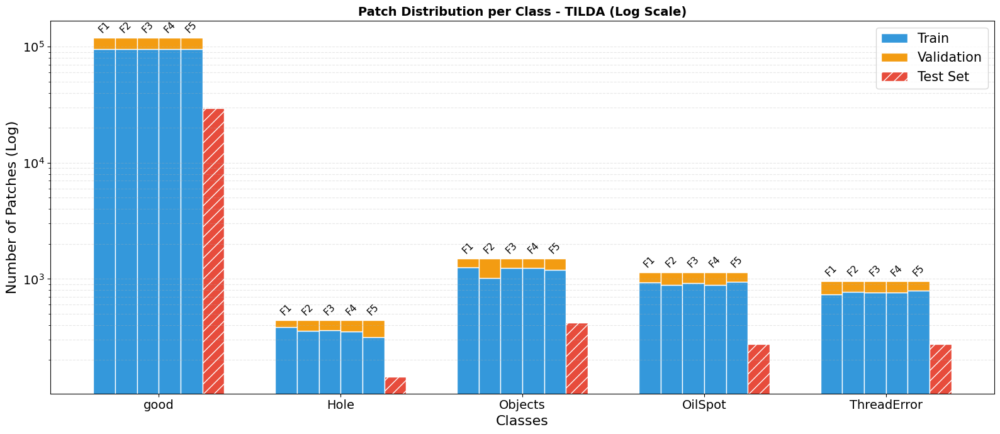

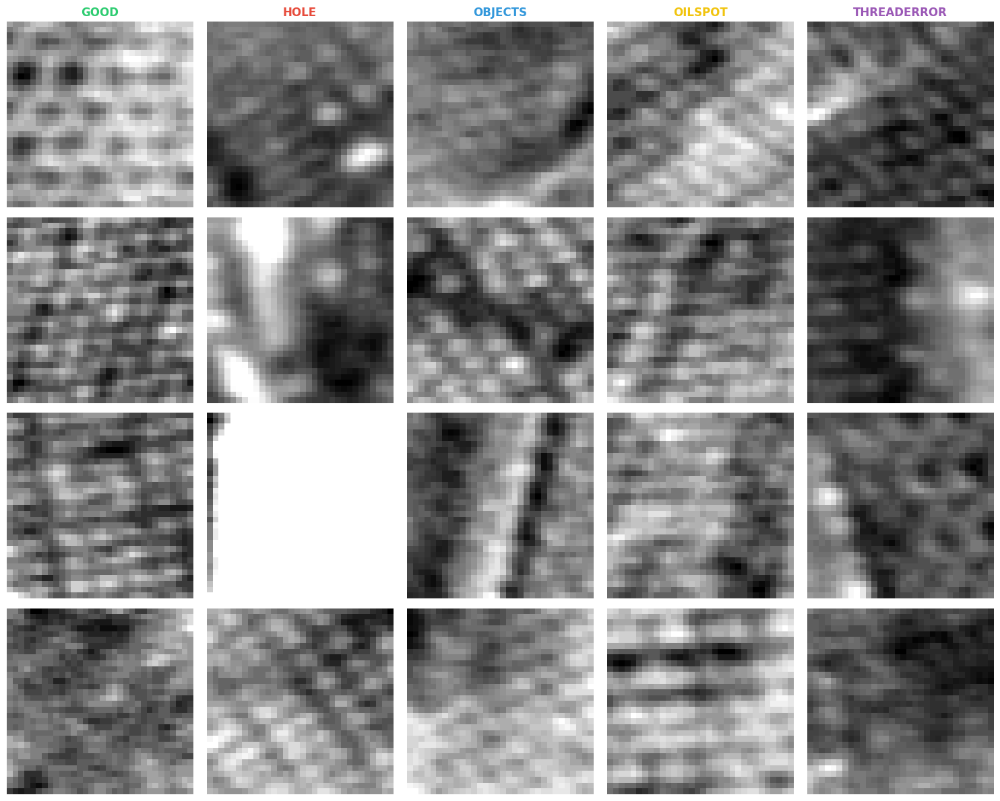

🔍 Carregando dados de: test_set.npz...
🖼️ Reconstruindo 4 imagens em um grid compacto 2x2:



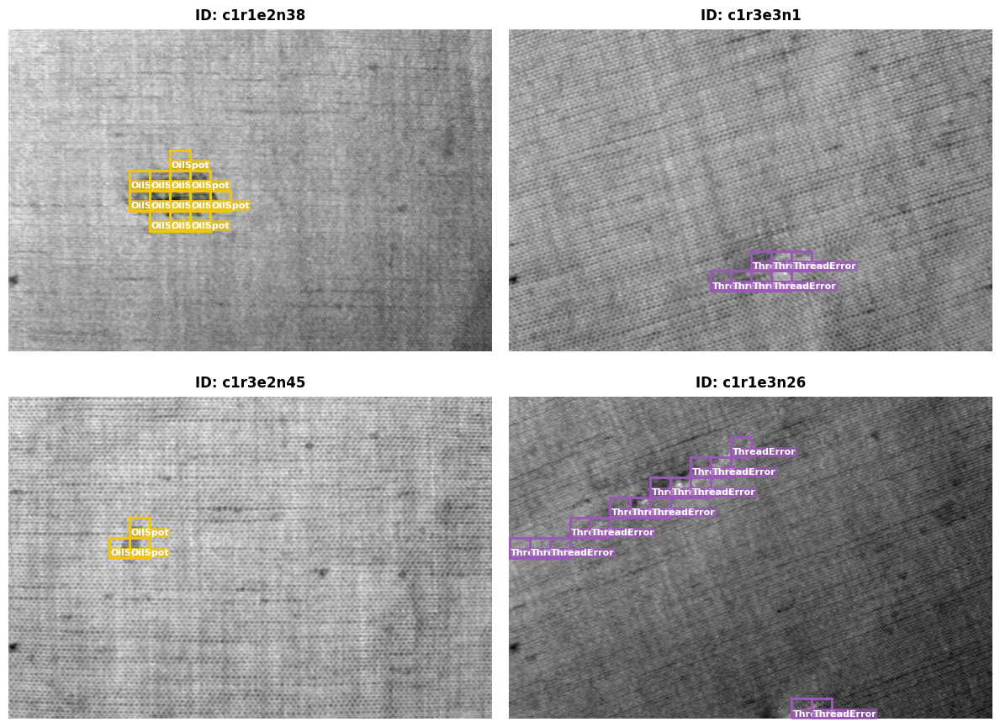

In [5]:
TARGET_DATASET = "TILDA"
P_SIZE = 32
OUT_DIR = f"/kaggle/working/npz_{TARGET_DATASET.lower()}_{P_SIZE}"
ALPHA_THRESH = 0.18
BETA_THRESH = 0.22

cfg = DATASETS_CONFIG[TARGET_DATASET]

# 1. Mapeamento e Censo
df_census = build_dataset_census(TARGET_DATASET)

# 2. Split (Igual para todos)
df_test, folds_dict = perform_stratified_split(df_census, SEED)

# 3. Processamento Físico
# Test Set
process_to_npz(df_test, OUT_DIR, "test_set.npz", P_SIZE, ALPHA_THRESH, BETA_THRESH)

# Folds
for f_name, splits in folds_dict.items():
    process_to_npz(splits['train'], OUT_DIR, f"{f_name}_train.npz", P_SIZE, ALPHA_THRESH, BETA_THRESH)
    process_to_npz(splits['val'], OUT_DIR, f"{f_name}_val.npz", P_SIZE, ALPHA_THRESH, BETA_THRESH)

# 4. Relatório Final
class_map_full = {0: "good"}
class_map_full.update({k+1: v for k, v in cfg['classes'].items()})

consolidado_report["32×32"] = run_full_eda_report(TARGET_DATASET, OUT_DIR, class_map_full)
plot_sample_patches_from_npz(
    output_dir=OUT_DIR, 
    filename="test_set.npz", 
    class_map=class_map_full, 
    colors=cfg['colors'],
    n_samples=4
)

plot_reconstructed_test_images(
    output_dir=OUT_DIR, 
    filename="test_set.npz", 
    class_map=class_map_full, 
    colors=cfg["colors"],
    patch_size=P_SIZE,
    n_samples=4    
)

## TILDA - 64x64

🔍 Iniciando censo para: TILDA
✅ Censo concluído: 400 imagens encontradas.


Saving Fold_4_val.npz: 100%|██████████| 64/64 [00:00<00:00, 132.74it/s]



📊 GERANDO RELATÓRIO COMPLETO EDA: TILDA

📈 Tabela de Distribuição por Divisão (Splits):


,Split,Images,Total Patches,good,Hole,Objects,OilSpot,ThreadError
0,Test Set,80,7680,7315,58,127,91,89
1,F1 - Train,256,24576,23480,166,395,303,232
2,F1 - Val,64,6144,5896,31,82,66,69
3,F2 - Train,256,24576,23547,163,331,289,246
4,F2 - Val,64,6144,5829,34,146,80,55
5,F3 - Train,256,24576,23488,156,399,290,243
6,F3 - Val,64,6144,5888,41,78,79,58
7,F4 - Train,256,24576,23495,157,397,288,239
8,F4 - Val,64,6144,5881,40,80,81,62
9,F5 - Train,256,24576,23494,146,386,306,244



📐 MÉTRICA GEOMÉTRICA DA MÁSCARA (GROUND TRUTH VS PATCHES):
  • Total Pixels Interseção: 9603558
  • Total Pixels União:       31750052
  • Mean Pixel IoU Real:      0.30247

🧶 Distribuição de Patches por Tecido no Test Set (TILDA):


Class,good,Hole,Objects,OilSpot,ThreadError
Fabric,,,,,
plain,7315,58,127,91,89


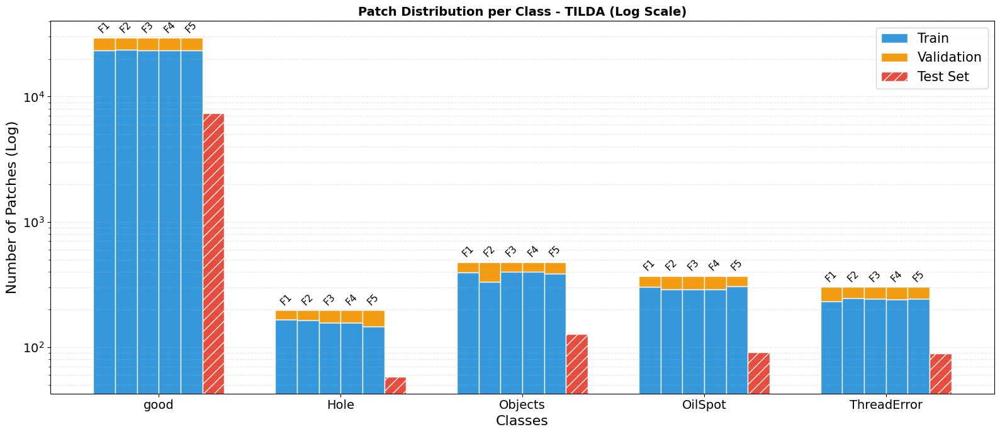

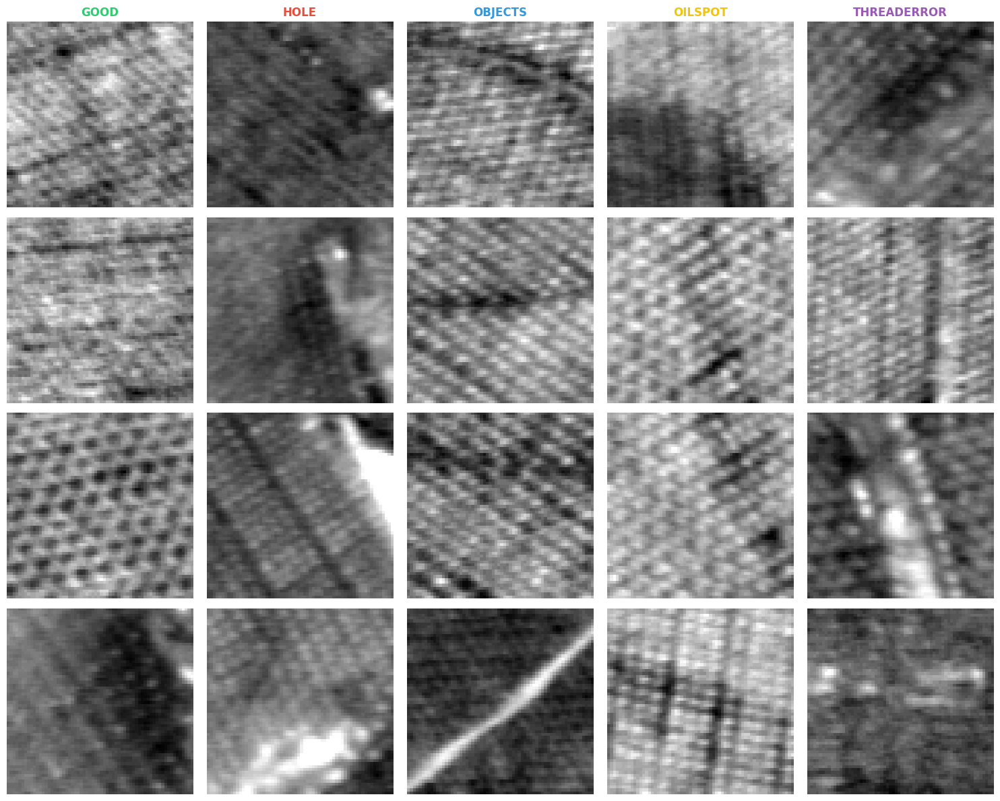

🔍 Carregando dados de: test_set.npz...
🖼️ Reconstruindo 4 imagens em um grid compacto 2x2:



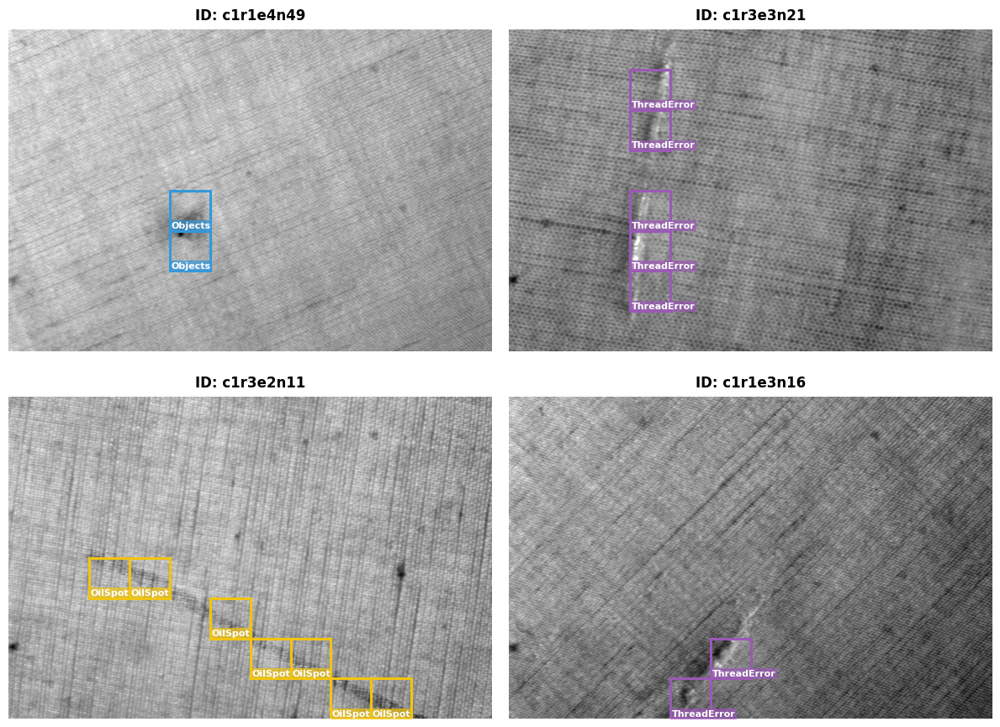

In [6]:
TARGET_DATASET = "TILDA"
P_SIZE = 64
OUT_DIR = f"/kaggle/working/npz_{TARGET_DATASET.lower()}_{P_SIZE}"
ALPHA_THRESH = 0.18
BETA_THRESH = 0.22

cfg = DATASETS_CONFIG[TARGET_DATASET]

# 1. Mapeamento e Censo
df_census = build_dataset_census(TARGET_DATASET)

# 2. Split (Igual para todos)
df_test, folds_dict = perform_stratified_split(df_census, SEED)

# 3. Processamento Físico
# Test Set
process_to_npz(df_test, OUT_DIR, "test_set.npz", P_SIZE, ALPHA_THRESH, BETA_THRESH)

# Folds
for f_name, splits in folds_dict.items():
    process_to_npz(splits['train'], OUT_DIR, f"{f_name}_train.npz", P_SIZE, ALPHA_THRESH, BETA_THRESH)
    process_to_npz(splits['val'], OUT_DIR, f"{f_name}_val.npz", P_SIZE, ALPHA_THRESH, BETA_THRESH)

# 4. Relatório Final
class_map_full = {0: "good"}
class_map_full.update({k+1: v for k, v in cfg['classes'].items()})

consolidado_report["64x64"] = run_full_eda_report(TARGET_DATASET, OUT_DIR, class_map_full)
plot_sample_patches_from_npz(
    output_dir=OUT_DIR, 
    filename="test_set.npz", 
    class_map=class_map_full, 
    colors=cfg['colors'],
    n_samples=4
)

plot_reconstructed_test_images(
    output_dir=OUT_DIR, 
    filename="test_set.npz", 
    class_map=class_map_full, 
    colors=cfg["colors"],
    patch_size=P_SIZE,
    n_samples=4  
)

## TILDA - 128x128

🔍 Iniciando censo para: TILDA
✅ Censo concluído: 400 imagens encontradas.


Saving Fold_4_val.npz: 100%|██████████| 64/64 [00:00<00:00, 149.82it/s]



📊 GERANDO RELATÓRIO COMPLETO EDA: TILDA

📈 Tabela de Distribuição por Divisão (Splits):


,Split,Images,Total Patches,good,Hole,Objects,OilSpot,ThreadError
0,Test Set,80,1920,1734,38,43,49,56
1,F1 - Train,256,6144,5615,112,143,123,151
2,F1 - Val,64,1536,1411,26,33,34,32
3,F2 - Train,256,6144,5625,112,135,127,145
4,F2 - Val,64,1536,1401,26,41,30,38
5,F3 - Train,256,6144,5620,110,139,128,147
6,F3 - Val,64,1536,1406,28,37,29,36
7,F4 - Train,256,6144,5620,111,144,124,145
8,F4 - Val,64,1536,1406,27,32,33,38
9,F5 - Train,256,6144,5624,107,143,126,144



📐 MÉTRICA GEOMÉTRICA DA MÁSCARA (GROUND TRUTH VS PATCHES):
  • Total Pixels Interseção: 8601928
  • Total Pixels União:       60354626
  • Mean Pixel IoU Real:      0.14252

🧶 Distribuição de Patches por Tecido no Test Set (TILDA):


Class,good,Hole,Objects,OilSpot,ThreadError
Fabric,,,,,
plain,1734,38,43,49,56


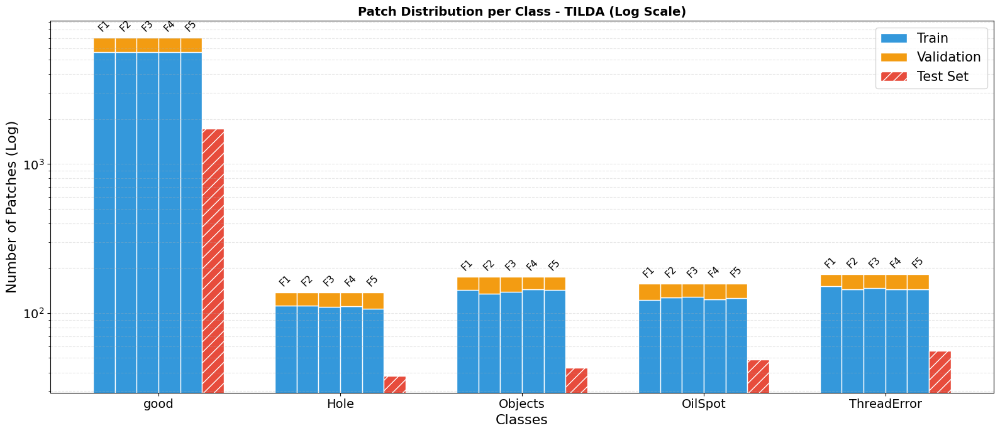

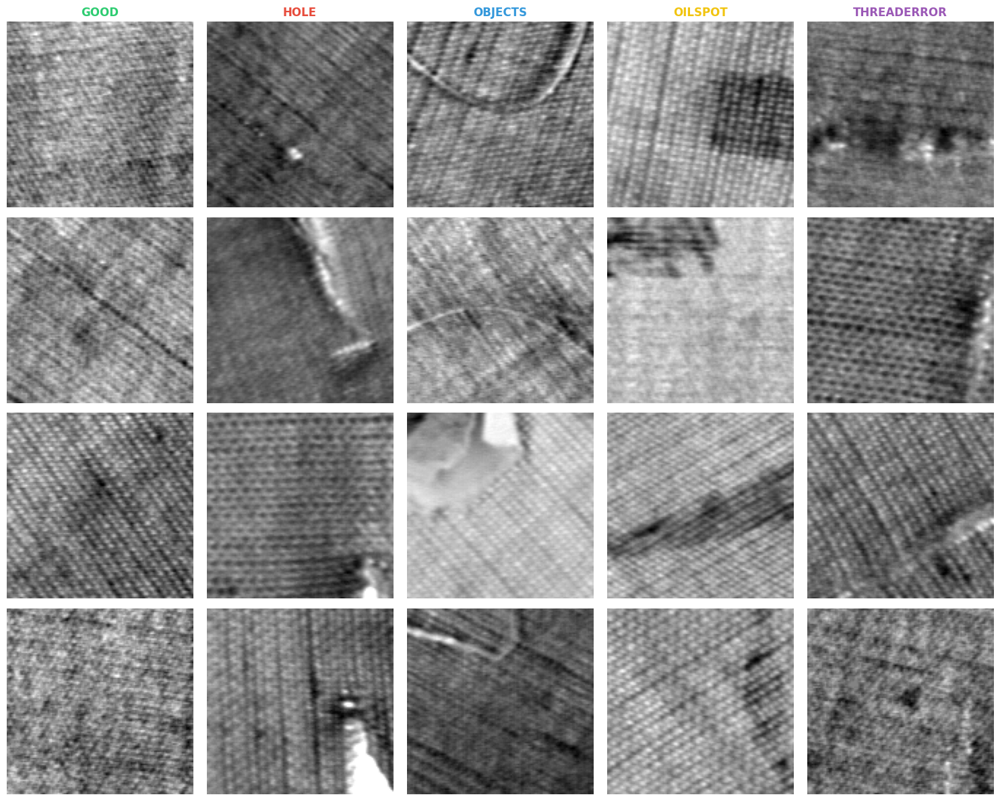

🔍 Carregando dados de: test_set.npz...
🖼️ Reconstruindo 4 imagens em um grid compacto 2x2:



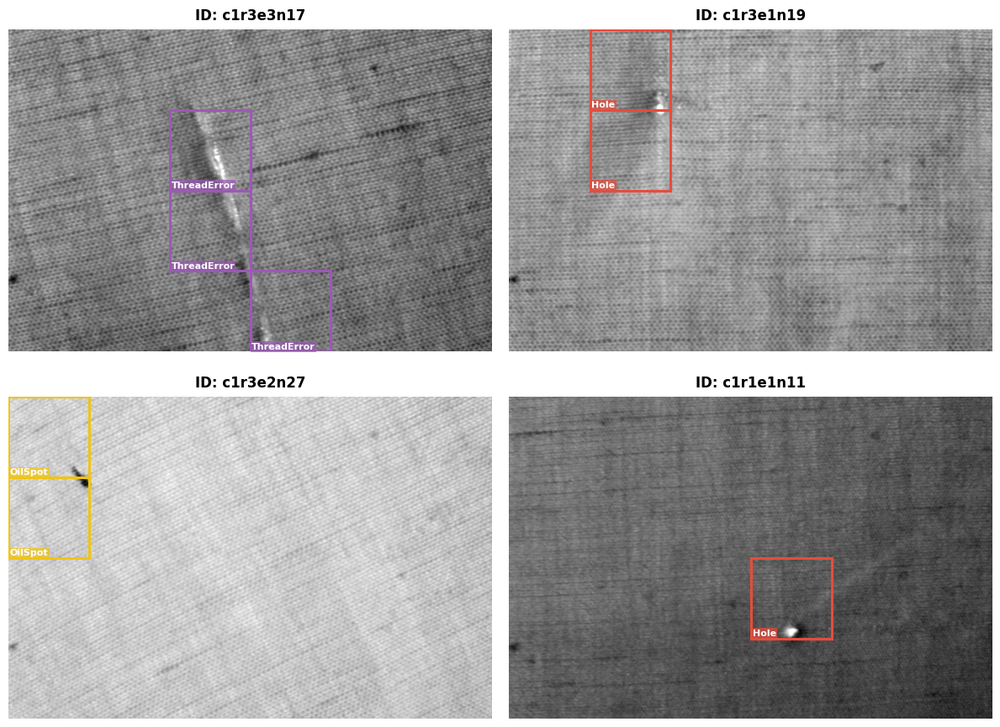

In [7]:
TARGET_DATASET = "TILDA"
P_SIZE = 128
OUT_DIR = f"/kaggle/working/npz_{TARGET_DATASET.lower()}_{P_SIZE}"
ALPHA_THRESH = 0.18
BETA_THRESH = 0.22

cfg = DATASETS_CONFIG[TARGET_DATASET]

# 1. Mapeamento e Censo
df_census = build_dataset_census(TARGET_DATASET)

# 2. Split (Igual para todos)
df_test, folds_dict = perform_stratified_split(df_census, SEED)

# 3. Processamento Físico
# Test Set
process_to_npz(df_test, OUT_DIR, "test_set.npz", P_SIZE, ALPHA_THRESH, BETA_THRESH)

# Folds
for f_name, splits in folds_dict.items():
    process_to_npz(splits['train'], OUT_DIR, f"{f_name}_train.npz", P_SIZE, ALPHA_THRESH, BETA_THRESH)
    process_to_npz(splits['val'], OUT_DIR, f"{f_name}_val.npz", P_SIZE, ALPHA_THRESH, BETA_THRESH)

# 4. Relatório Final
class_map_full = {0: "good"}
class_map_full.update({k+1: v for k, v in cfg['classes'].items()})

consolidado_report["128x128"] = run_full_eda_report(TARGET_DATASET, OUT_DIR, class_map_full)
plot_sample_patches_from_npz(
    output_dir=OUT_DIR, 
    filename="test_set.npz", 
    class_map=class_map_full, 
    colors=cfg['colors'],
    n_samples=4
)
plot_reconstructed_test_images(
    output_dir=OUT_DIR, 
    filename="test_set.npz", 
    class_map=class_map_full, 
    colors=cfg["colors"],
    patch_size=P_SIZE,
    n_samples=4    
)

In [8]:
# =============================================================================
# 📊 GERADOR DA TABELA COMPARATIVA FINAL
# =============================================================================
print("\n" + "="*50)
print("🏆 TABELA COMPARATIVA DOS TAMANHOS DE PATCH")
print("="*50)

# Transforma o dicionário acumulado em DataFrame
df_comparativo = pd.DataFrame(consolidado_report)

# Nomeia a coluna de índices para ficar idêntica ao seu modelo
df_comparativo.index.name = "Class / Metric"
df_comparativo = df_comparativo.reset_index()

# Exibe na tela de forma limpa e organizada
display(df_comparativo)


🏆 TABELA COMPARATIVA DOS TAMANHOS DE PATCH


,Class / Metric,32×32,64x64,128x128
0,Good,623818,154195,36864
1,Hole,2364,1043,728
2,Objects,7883,2512,923
3,Oilspot,5990,1936,834
4,Threaderror,5065,1594,971
5,Total Patches,645120,161280,40320
6,Defective (%),3.30,4.39,8.57
7,Good (%),96.70,95.61,91.43
8,Mean IoU,0.4859,0.3025,0.1425


## HKU - 32x32

In [9]:
consolidado_report = {}

🔍 Iniciando censo para: HKU


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


✅ Censo concluído: 161 imagens encontradas.


Saving Fold_4_val.npz: 100%|██████████| 25/25 [00:00<00:00, 280.11it/s]



📊 GERANDO RELATÓRIO COMPLETO EDA: HKU

📈 Tabela de Distribuição por Divisão (Splits):


,Split,Images,Total Patches,good,BrokenEnd,Hole,NettingMultiple,ThickBar,ThinBar,Knots
0,Test Set,33,2112,2069,8,4,11,10,8,2
1,F1 - Train,102,6528,6289,60,25,31,80,28,15
2,F1 - Val,26,1664,1613,8,11,4,17,5,6
3,F2 - Train,102,6528,6300,59,29,31,65,28,16
4,F2 - Val,26,1664,1602,9,7,4,32,5,5
5,F3 - Train,102,6528,6308,66,27,21,66,26,14
6,F3 - Val,26,1664,1594,2,9,14,31,7,7
7,F4 - Train,103,6592,6341,58,31,25,93,23,21
8,F4 - Val,25,1600,1561,10,5,10,4,10,0
9,F5 - Train,103,6592,6370,29,32,32,84,27,18



📐 MÉTRICA GEOMÉTRICA DA MÁSCARA (GROUND TRUTH VS PATCHES):
  • Total Pixels Interseção: 657128
  • Total Pixels União:       1687299
  • Mean Pixel IoU Real:      0.38946

🧶 Distribuição de Patches por Tecido no Test Set (HKU):


Class,good,BrokenEnd,Hole,NettingMultiple,ThickBar,ThinBar,Knots
Fabric,,,,,,,
box,691,0,3,0,10,0,0
dot,435,0,0,9,0,2,2
star,943,8,1,2,0,6,0


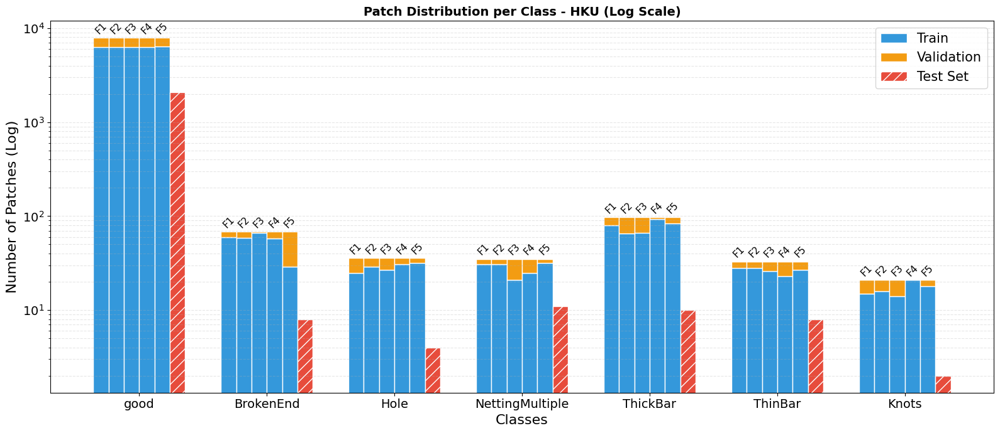

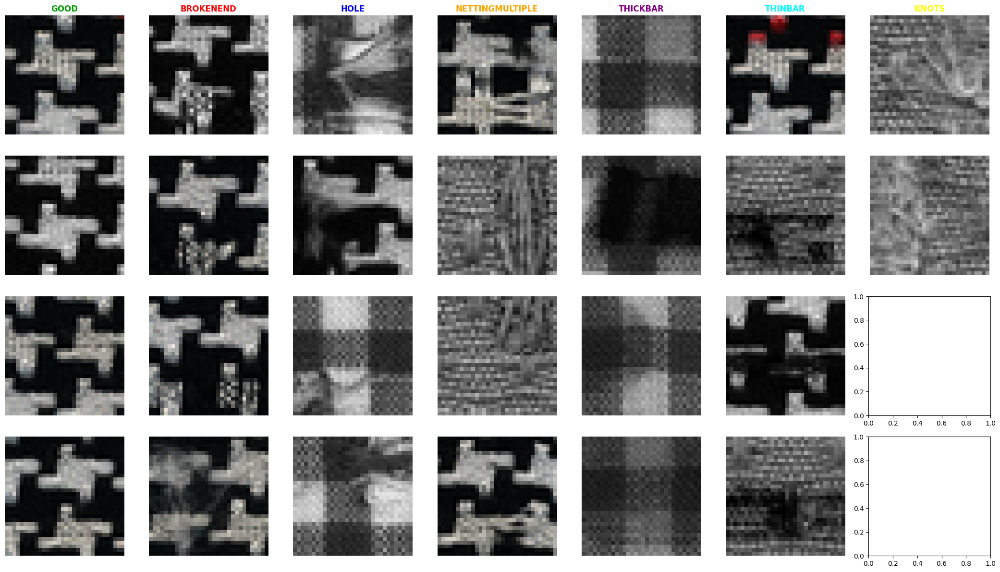

🔍 Carregando dados de: test_set.npz...
🖼️ Reconstruindo 4 imagens em um grid compacto 2x2:



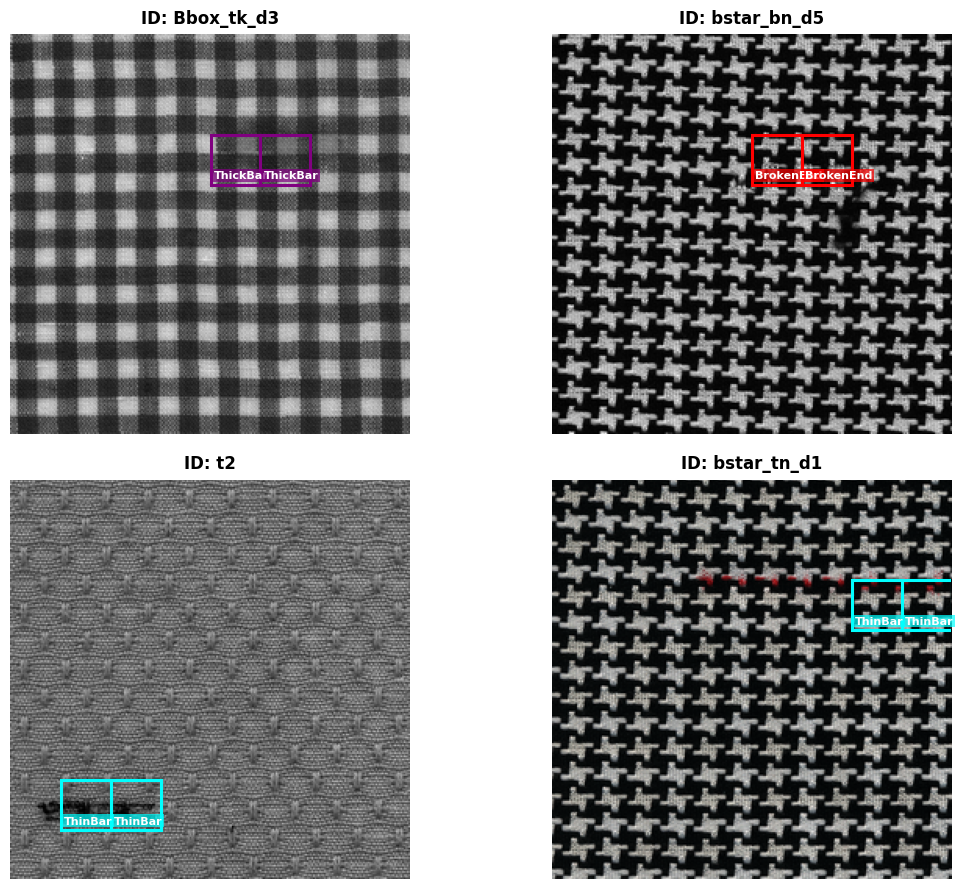

In [10]:
TARGET_DATASET = "HKU"
P_SIZE = 32
OUT_DIR = f"/kaggle/working/npz_{TARGET_DATASET.lower()}_{P_SIZE}"
ALPHA_THRESH = 0.18
BETA_THRESH = 0.22

cfg = DATASETS_CONFIG[TARGET_DATASET]

# 1. Mapeamento e Censo
df_census = build_dataset_census(TARGET_DATASET)

# 2. Split (Igual para todos)
df_test, folds_dict = perform_stratified_split(df_census, SEED)

# 3. Processamento Físico
# Test Set
process_to_npz(df_test, OUT_DIR, "test_set.npz", P_SIZE, ALPHA_THRESH, BETA_THRESH)

# Folds
for f_name, splits in folds_dict.items():
    process_to_npz(splits['train'], OUT_DIR, f"{f_name}_train.npz", P_SIZE, ALPHA_THRESH, BETA_THRESH)
    process_to_npz(splits['val'], OUT_DIR, f"{f_name}_val.npz", P_SIZE, ALPHA_THRESH, BETA_THRESH)

# 4. Relatório Final
class_map_full = {0: "good"}
class_map_full.update({k+1: v for k, v in cfg['classes'].items()})

consolidado_report["32x32"] = run_full_eda_report(TARGET_DATASET, OUT_DIR, class_map_full)
plot_sample_patches_from_npz(
    output_dir=OUT_DIR, 
    filename="test_set.npz", 
    class_map=class_map_full, 
    colors=cfg['colors'],
    n_samples=4
)

plot_reconstructed_test_images(
    output_dir=OUT_DIR, 
    filename="test_set.npz", 
    class_map=class_map_full, 
    colors=cfg["colors"],
    patch_size=P_SIZE,
    n_samples=4    
)

## HKU - 64x64

/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


🔍 Iniciando censo para: HKU
✅ Censo concluído: 161 imagens encontradas.


Saving Fold_4_val.npz: 100%|██████████| 25/25 [00:00<00:00, 390.20it/s]



📊 GERANDO RELATÓRIO COMPLETO EDA: HKU

📈 Tabela de Distribuição por Divisão (Splits):


,Split,Images,Total Patches,good,BrokenEnd,Hole,NettingMultiple,ThickBar,ThinBar,Knots
0,Test Set,33,528,498,6,4,7,4,7,2
1,F1 - Train,102,1632,1505,29,16,24,29,24,5
2,F1 - Val,26,416,389,5,6,4,7,4,1
3,F2 - Train,102,1632,1509,32,17,22,25,23,4
4,F2 - Val,26,416,385,2,5,6,11,5,2
5,F3 - Train,102,1632,1515,26,18,21,26,20,6
6,F3 - Val,26,416,379,8,4,7,10,8,0
7,F4 - Train,103,1648,1519,28,18,22,34,21,6
8,F4 - Val,25,400,375,6,4,6,2,7,0
9,F5 - Train,103,1648,1528,21,19,23,30,24,3



📐 MÉTRICA GEOMÉTRICA DA MÁSCARA (GROUND TRUTH VS PATCHES):
  • Total Pixels Interseção: 664519
  • Total Pixels União:       3427876
  • Mean Pixel IoU Real:      0.19386

🧶 Distribuição de Patches por Tecido no Test Set (HKU):


Class,good,BrokenEnd,Hole,NettingMultiple,ThickBar,ThinBar,Knots
Fabric,,,,,,,
box,169,0,3,0,4,0,0
dot,102,0,0,6,0,2,2
star,227,6,1,1,0,5,0


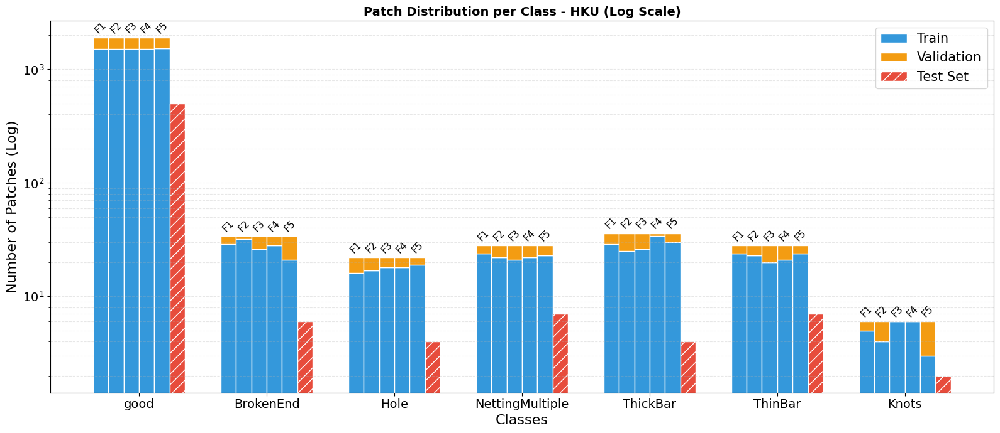

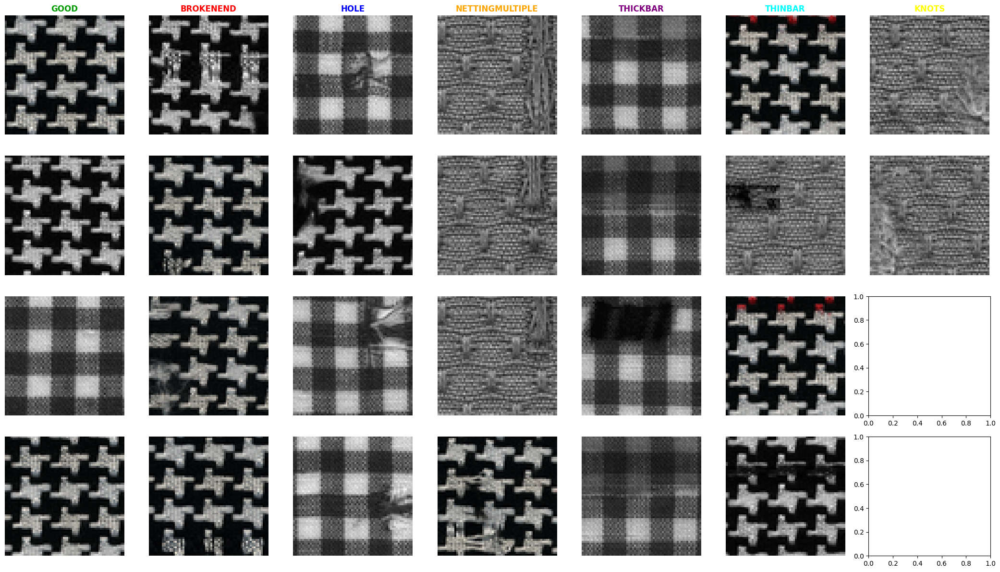

🔍 Carregando dados de: test_set.npz...
🖼️ Reconstruindo 4 imagens em um grid compacto 2x2:



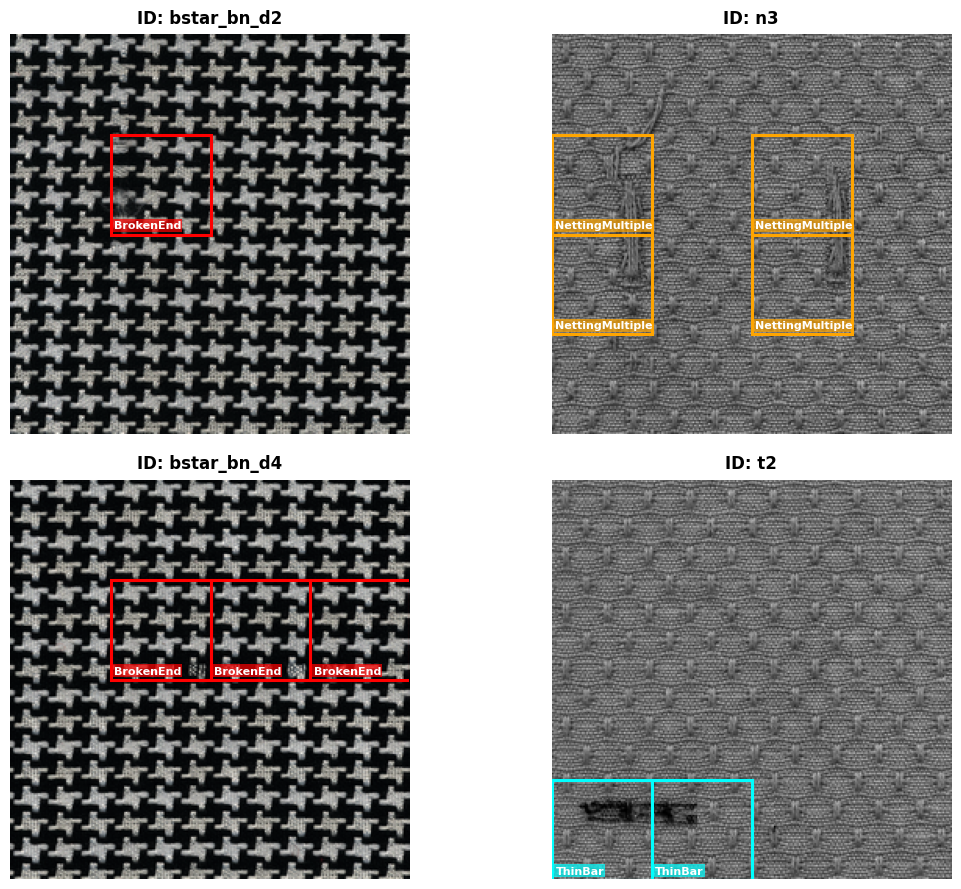

In [11]:
TARGET_DATASET = "HKU"
P_SIZE = 64
OUT_DIR = f"/kaggle/working/npz_{TARGET_DATASET.lower()}_{P_SIZE}"
ALPHA_THRESH = 0.18
BETA_THRESH = 0.22

cfg = DATASETS_CONFIG[TARGET_DATASET]

# 1. Mapeamento e Censo
df_census = build_dataset_census(TARGET_DATASET)

# 2. Split (Igual para todos)
df_test, folds_dict = perform_stratified_split(df_census, SEED)

# 3. Processamento Físico
# Test Set
process_to_npz(df_test, OUT_DIR, "test_set.npz", P_SIZE, ALPHA_THRESH, BETA_THRESH)

# Folds
for f_name, splits in folds_dict.items():
    process_to_npz(splits['train'], OUT_DIR, f"{f_name}_train.npz", P_SIZE, ALPHA_THRESH, BETA_THRESH)
    process_to_npz(splits['val'], OUT_DIR, f"{f_name}_val.npz", P_SIZE, ALPHA_THRESH, BETA_THRESH)

# 4. Relatório Final
class_map_full = {0: "good"}
class_map_full.update({k+1: v for k, v in cfg['classes'].items()})

consolidado_report["64x64"] = run_full_eda_report(TARGET_DATASET, OUT_DIR, class_map_full)
plot_sample_patches_from_npz(
    output_dir=OUT_DIR, 
    filename="test_set.npz", 
    class_map=class_map_full, 
    colors=cfg['colors'],
    n_samples=4
)

plot_reconstructed_test_images(
    output_dir=OUT_DIR, 
    filename="test_set.npz", 
    class_map=class_map_full, 
    colors=cfg["colors"],
    patch_size=P_SIZE,
    n_samples=4    
)

## HKU - 128x128

/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


🔍 Iniciando censo para: HKU
✅ Censo concluído: 161 imagens encontradas.


Saving Fold_4_val.npz: 100%|██████████| 25/25 [00:00<00:00, 224.46it/s]



📊 GERANDO RELATÓRIO COMPLETO EDA: HKU

📈 Tabela de Distribuição por Divisão (Splits):


,Split,Images,Total Patches,good,BrokenEnd,Hole,NettingMultiple,ThickBar,ThinBar,Knots
0,Test Set,33,132,106,4,4,7,4,5,2
1,F1 - Train,102,408,306,17,14,19,23,21,8
2,F1 - Val,26,104,82,3,4,4,5,4,2
3,F2 - Train,102,408,309,17,13,19,21,22,7
4,F2 - Val,26,104,79,3,5,4,7,3,3
5,F3 - Train,102,408,315,16,15,16,21,17,8
6,F3 - Val,26,104,73,4,3,7,7,8,2
7,F4 - Train,103,412,311,15,15,18,24,19,10
8,F4 - Val,25,100,77,5,3,5,4,6,0
9,F5 - Train,103,412,311,15,15,20,23,21,7



📐 MÉTRICA GEOMÉTRICA DA MÁSCARA (GROUND TRUTH VS PATCHES):
  • Total Pixels Interseção: 752574
  • Total Pixels União:       10647085
  • Mean Pixel IoU Real:      0.07068

🧶 Distribuição de Patches por Tecido no Test Set (HKU):


Class,good,BrokenEnd,Hole,NettingMultiple,ThickBar,ThinBar,Knots
Fabric,,,,,,,
box,37,0,3,0,4,0,0
dot,19,0,0,6,0,1,2
star,50,4,1,1,0,4,0


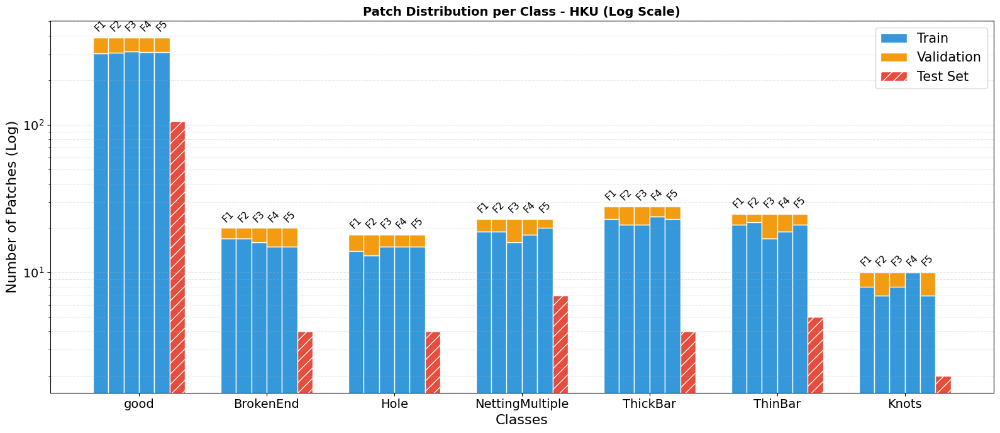

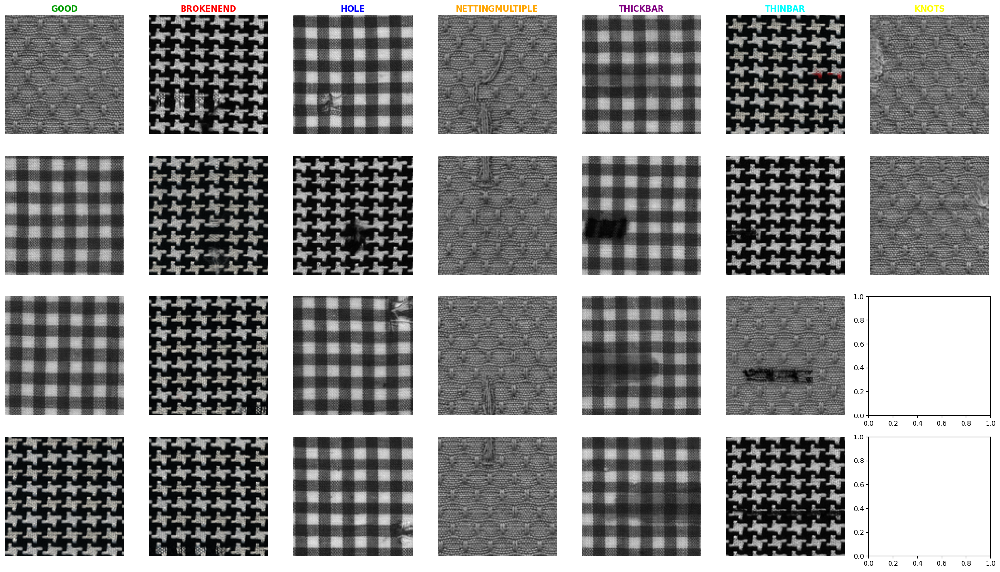

🔍 Carregando dados de: test_set.npz...
🖼️ Reconstruindo 4 imagens em um grid compacto 2x2:



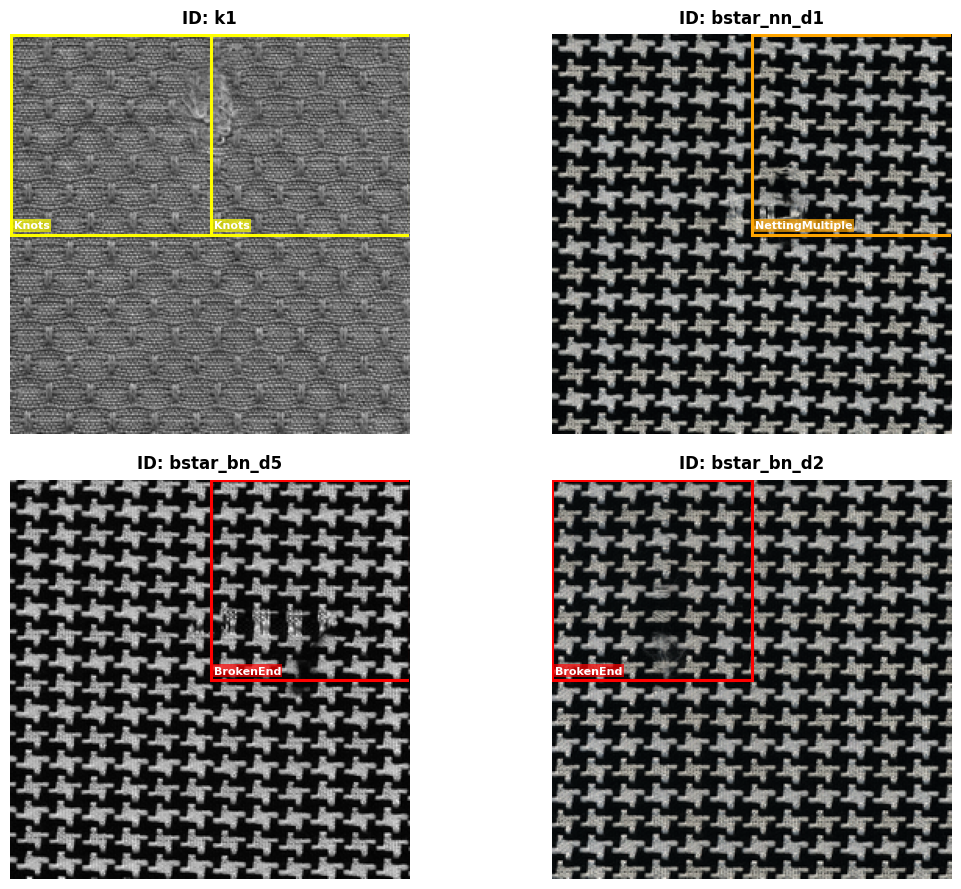

In [12]:
TARGET_DATASET = "HKU"
P_SIZE = 128
OUT_DIR = f"/kaggle/working/npz_{TARGET_DATASET.lower()}_{P_SIZE}"
ALPHA_THRESH = 0.18
BETA_THRESH = 0.22

cfg = DATASETS_CONFIG[TARGET_DATASET]

# 1. Mapeamento e Censo
df_census = build_dataset_census(TARGET_DATASET)

# 2. Split (Igual para todos)
df_test, folds_dict = perform_stratified_split(df_census, SEED)

# 3. Processamento Físico
# Test Set
process_to_npz(df_test, OUT_DIR, "test_set.npz", P_SIZE, ALPHA_THRESH, BETA_THRESH)

# Folds
for f_name, splits in folds_dict.items():
    process_to_npz(splits['train'], OUT_DIR, f"{f_name}_train.npz", P_SIZE, ALPHA_THRESH, BETA_THRESH)
    process_to_npz(splits['val'], OUT_DIR, f"{f_name}_val.npz", P_SIZE, ALPHA_THRESH, BETA_THRESH)

# 4. Relatório Final
class_map_full = {0: "good"}
class_map_full.update({k+1: v for k, v in cfg['classes'].items()})

consolidado_report["128x128"] = run_full_eda_report(TARGET_DATASET, OUT_DIR, class_map_full)
plot_sample_patches_from_npz(
    output_dir=OUT_DIR, 
    filename="test_set.npz", 
    class_map=class_map_full, 
    colors=cfg['colors'],
    n_samples=4
)

plot_reconstructed_test_images(
    output_dir=OUT_DIR, 
    filename="test_set.npz", 
    class_map=class_map_full, 
    colors=cfg["colors"],
    patch_size=P_SIZE,
    n_samples=4    
)

In [13]:
# =============================================================================
# 📊 GERADOR DA TABELA COMPARATIVA FINAL
# =============================================================================
print("\n" + "="*50)
print("🏆 TABELA COMPARATIVA DOS TAMANHOS DE PATCH")
print("="*50)

# Transforma o dicionário acumulado em DataFrame
df_comparativo = pd.DataFrame(consolidado_report)

# Nomeia a coluna de índices para ficar idêntica ao seu modelo
df_comparativo.index.name = "Class / Metric"
df_comparativo = df_comparativo.reset_index()

# Exibe na tela de forma limpa e organizada
display(df_comparativo)


🏆 TABELA COMPARATIVA DOS TAMANHOS DE PATCH


,Class / Metric,32x32,64x64,128x128
0,Good,41579,9968,2046
1,Brokenend,348,176,104
2,Hole,184,114,94
3,Nettingmultiple,186,147,122
4,Thickbar,495,184,144
5,Thinbar,173,147,130
6,Knots,107,32,52
7,Total Patches,43072,10768,2692
8,Defective (%),3.47,7.43,24.00
9,Good (%),96.53,92.57,76.00
